In [1]:
import pandas as pd
import numpy as np
from sklearn import preprocessing 

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import warnings
warnings.filterwarnings('ignore')

# clustering
from sklearn.cluster import KMeans
from yellowbrick.cluster import KElbowVisualizer
from yellowbrick.cluster import SilhouetteVisualizer
from sklearn.cluster import AgglomerativeClustering
from sklearn.decomposition import PCA
from sklearn.neighbors import NearestNeighbors

# classificazione
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split 

from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC, LinearSVC, NuSVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier

from sklearn.model_selection import train_test_split, cross_val_score, StratifiedKFold, GridSearchCV, learning_curve
from sklearn.metrics import accuracy_score, log_loss, confusion_matrix, classification_report, roc_curve, auc

from yellowbrick.classifier import PrecisionRecallCurve
from yellowbrick.classifier import ClassificationReport
from yellowbrick.model_selection import LearningCurve

In [3]:
# Importa il dataset dataset
australia = pd.read_csv("AUS.csv", header = 0)

australia.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


# ETL

In [4]:
# rinomina le colonne
new_names = {'Date': 'date', 'Location': 'location','MinTemp': 'min_temp', 
            'MaxTemp': 'max_temp', 'Rainfall':'rainfall', 'Evaporation': 'evaporation', 'Sunshine': 'sunshine', 
            'WindGustDir': 'wind_gust_dir', 'WindGustSpeed': 'wind_gust_speed', 'WindDir9am': 'wind_dir_9am', 'WindDir3pm': 'wind_dir_3pm',
            'WindSpeed9am': 'wind_speed_9am', 'WindSpeed3pm': 'wind_speed_3pm',
            'Humidity9am':'humidity_9am', 'Humidity3pm':'humidity_3pm', 'Pressure9am':'pressure_9am', 'Pressure3pm':'pressure_3pm',
            'Cloud9am':'cloud_9am', 'Cloud3pm':'cloud_3pm', 'Temp9am':'temp_9am', 'Temp3pm':'temp_3pm',
            'RainToday': 'rain_today', 'RainTomorrow': 'rain_tomorrow' }
australia.rename(columns=new_names, inplace=True)

# aggiunge la colonna "state"
#stati:
sa = ['Adelaide', 'MountGambier', 'Nuriootpa', 'Woomera'] #australia meridionale
wa = ['Albany', 'Witchcliffe', 'PearceRAAF', 'PerthAirport', 'Perth', 'SalmonGums',
      'Walpole'] #australia occidentale
nsw = ['Albury', 'BadgerysCreek', 'Cobar', 'CoffsHarbour', 'Moree',
       'Newcastle', 'NorahHead', 'Penrith', 'Richmond', 'Sydney', 'SydneyAirport',
       'WaggaWagga', 'Williamtown', 'Wollongong'] #Nuovo Galles del Sud
qld = ['Brisbane', 'Cairns', 'GoldCoast', 'Townsville'] #Queensland
tas = ['Hobart', 'Launceston'] #Tasmania
vic = ['Ballarat', 'Bendigo', 'Sale', 'Melbourne', 'MelbourneAirport',
      'Mildura', 'Nhil', 'Portland', 'Watsonia', 'Dartmoor'] #Victoria
act = ['Camberra', 'Tuggeranong', 'MountGinini'] #territorio della capitale australiana
nt = [ 'AliceSprings', 'Darwin', 'Katherine', 'Uluru'] #Territorio del nord
nfk = ['NorfolkIsland'] #territorio esterno del norfolk

def State(a):
    if a in sa:
        return 'SA'
    elif a in wa:
        return 'WA'
    elif a in nsw:
        return 'NSW'
    elif a in qld:
        return 'QLD'
    elif a in tas:
        return 'TAS'
    elif a in vic:
        return 'VIC'
    elif a in act:
        return 'ACT'
    elif a in nt:
        return 'NT'
    elif a in nfk:
        return 'NFK'

australia['state'] = australia.location.apply(lambda x: State(x))

print(australia.isnull().sum())
print(len(australia))

date                   0
location               0
min_temp            1485
max_temp            1261
rainfall            3261
evaporation        62790
sunshine           69835
wind_gust_dir      10326
wind_gust_speed    10263
wind_dir_9am       10566
wind_dir_3pm        4228
wind_speed_9am      1767
wind_speed_3pm      3062
humidity_9am        2654
humidity_3pm        4507
pressure_9am       15065
pressure_3pm       15028
cloud_9am          55888
cloud_3pm          59358
temp_9am            1767
temp_3pm            3609
rain_today          3261
rain_tomorrow       3267
state               3436
dtype: int64
145460


In [5]:
# Gestione dei valori null

# correzione del campo wind_dir e wind_speed:
# 0 al posto di null ai campi dir se la velocità del vento è 0 (non c'è vento in quel momento)
australia['wind_dir_9am'] = australia[['wind_dir_9am','wind_speed_9am']].apply(lambda x: '0' if x['wind_speed_9am']==0 else x['wind_dir_9am'], axis=1)
australia['wind_dir_3pm'] = australia[['wind_dir_3pm','wind_speed_3pm']].apply(lambda x: '0' if x['wind_speed_3pm']==0 else x['wind_dir_3pm'], axis=1)

# filtra per colonne:
australia = australia.drop(['wind_gust_dir','wind_gust_speed',"sunshine","evaporation"], axis=1)

# filtra per righe:
# elimina le città che hanno almeno il 40% di null sul campo cloud3pm o cloud9am
location = australia.location.unique()
for loc in location:
    lung = len(australia[australia['location']==loc])
    null_3pm = australia[australia['location']==loc].isnull().sum().cloud_3pm
    null_9am = australia[australia['location']==loc].isnull().sum().cloud_9am
    if (null_3pm > lung * 0.4) or (null_9am > lung * 0.4):
        australia = australia.drop(australia[australia['location'] == loc].index)

        
print(australia.isnull().sum())
print(len(australia))

#imputation dei valori, prende il valore di quel campo alla riga precedente:
australia = australia.ffill(axis=0)

#australia.head()

date                  0
location              0
min_temp            999
max_temp            867
rainfall           2097
wind_dir_9am       1062
wind_dir_3pm       2413
wind_speed_9am     1040
wind_speed_3pm     2393
humidity_9am       1218
humidity_3pm       2502
pressure_9am       4280
pressure_3pm       4276
cloud_9am         11485
cloud_3pm         14545
temp_9am            923
temp_3pm           2251
rain_today         2097
rain_tomorrow      2102
state              3436
dtype: int64
95208


# Analisi descrittiva

In [6]:
# Aggiunge una colonna per l'anno

aus_descr = australia
aus_descr['date'] = pd.to_datetime(aus_descr['date'])
aus_descr['year'] = aus_descr['date'].dt.year

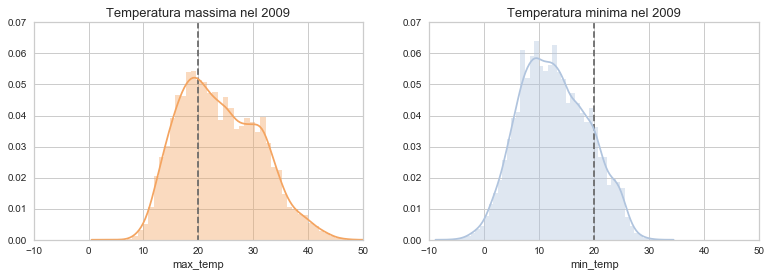

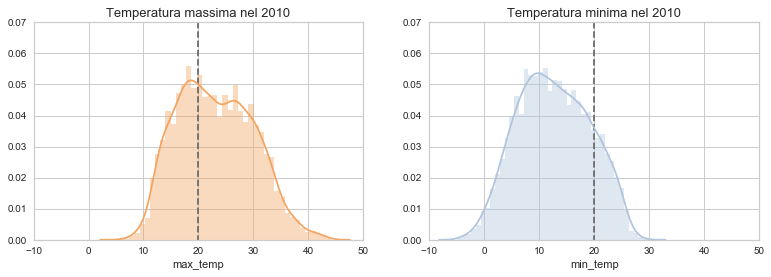

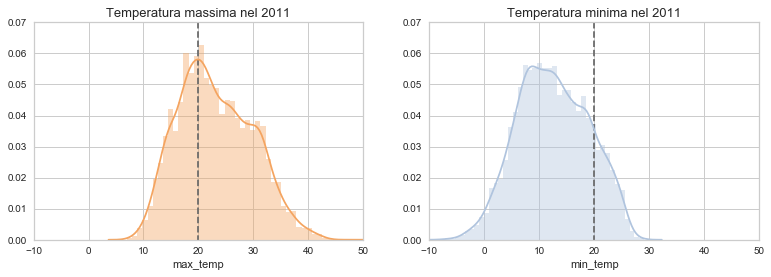

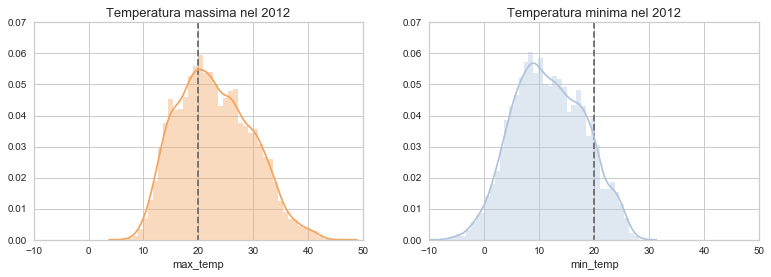

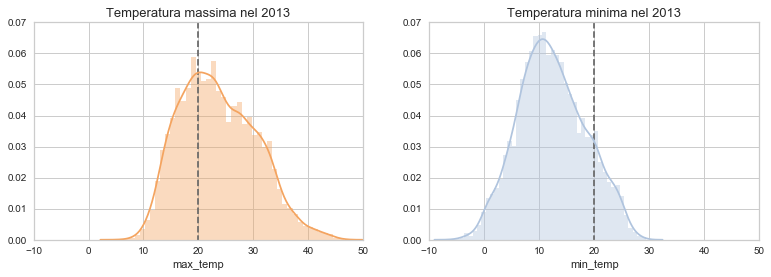

...

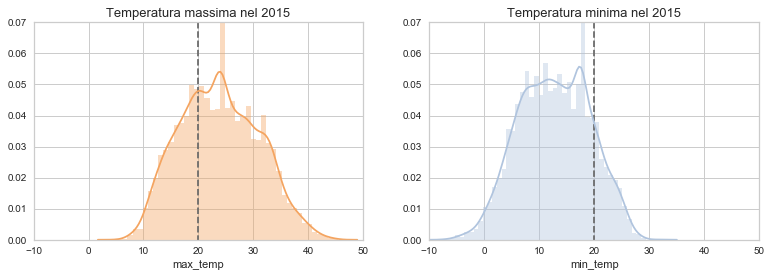

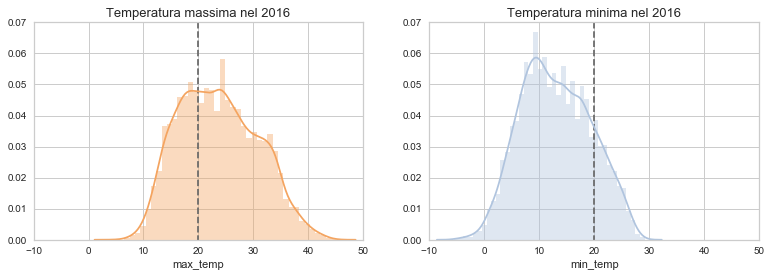

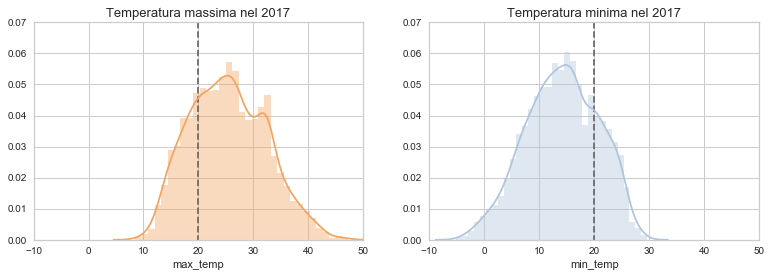

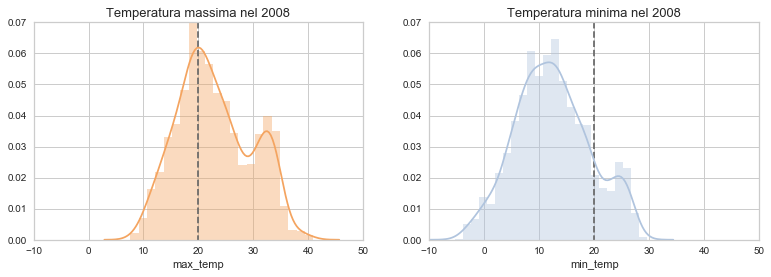

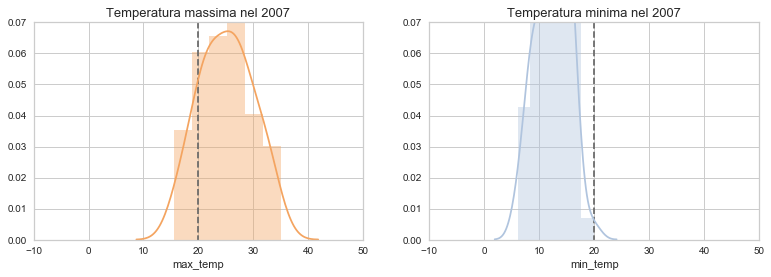

In [5]:
# Distribuzione della temperatura minima e massima divisa per anno

years = aus_descr.year.unique()
for y in years:
    aus = aus_descr[aus_descr['year']==y]

    fig, axes = plt.subplots(1, 2, figsize=(13, 4))
    axes[0].axvline(20,1,0, color='dimgray', ls='--')
    axes[1].axvline(20,1,0, color='dimgray', ls='--')
    axes[0].set(xlim=(-10, 50),ylim=(0, 0.07))
    axes[1].set(xlim=(-10, 50),ylim=(0, 0.07))
    axes[0].set_title('Temperatura massima nel '+str(y) , fontsize=13)
    axes[1].set_title('Temperatura minima nel '+str(y) , fontsize=13)
    sns.distplot(aus['max_temp'], ax=axes[0], color ='sandybrown')
    sns.distplot(aus['min_temp'], ax=axes[1], color ='lightsteelblue')

    plt.show

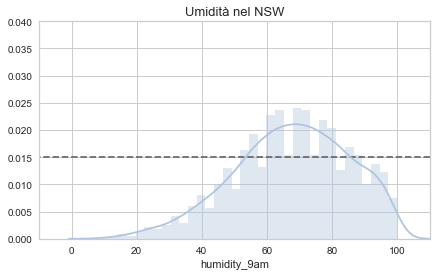

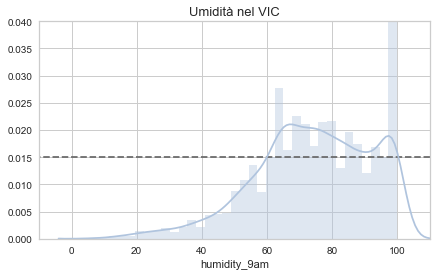

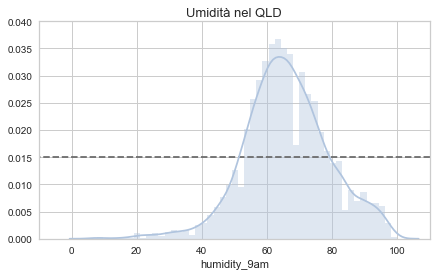

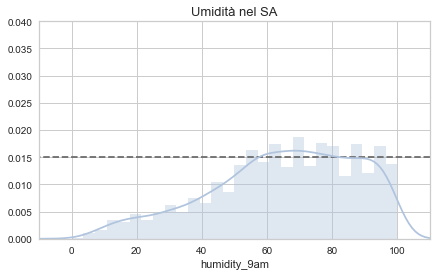

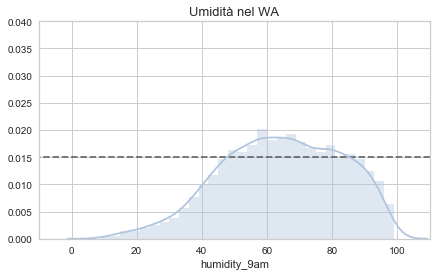

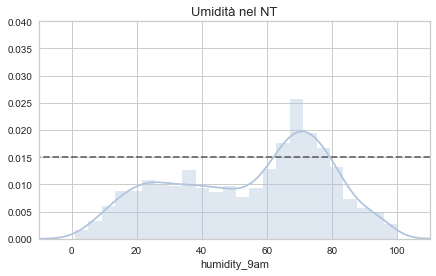

In [6]:
# Umidità divisa per stati

for st in aus_descr.state.unique():
    aus = aus_descr[aus_descr['state']==st]
    if len(aus)>6000:
        aus = aus.sample(6000)
        fig, axes = plt.subplots(1, 1, figsize=(7, 4))
        axes.axhline(0.015,1,0, color='dimgray', ls='--')
        axes.set(xlim=(-10, 110),ylim=(0, 0.04))
        axes.set_title('Umidità nel '+str(st), fontsize=13)
        sns.distplot(aus['humidity_9am'], ax=axes, color ='lightsteelblue')
        plt.show

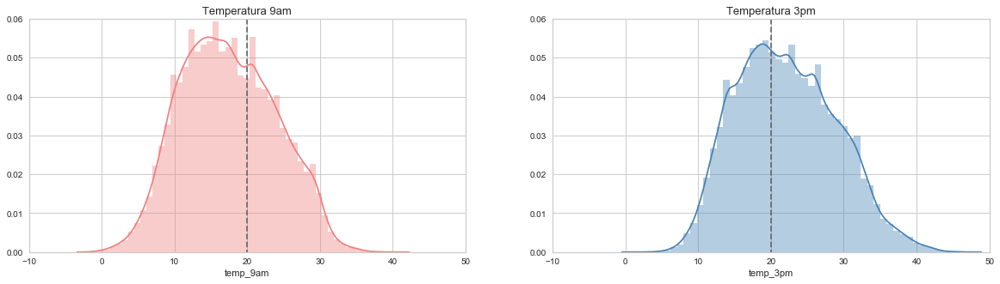

In [7]:
# Temperatura minima e massima generale

fig, axes = plt.subplots(1, 2, figsize=(20, 5))
axes[0].axvline(20,1,0, color='dimgray', ls='--')
axes[1].axvline(20,1,0, color='dimgray', ls='--')
axes[0].set(xlim=(-10, 50),ylim=(0, 0.06))
axes[1].set(xlim=(-10, 50),ylim=(0, 0.06))
axes[0].set_title('Temperatura 9am', fontsize=13)
axes[1].set_title('Temperatura 3pm', fontsize=13)
sns.distplot(aus_descr['temp_9am'], ax=axes[0], color ='lightcoral')
sns.distplot(aus_descr['temp_3pm'], ax=axes[1], color ='steelblue')
plt.show;

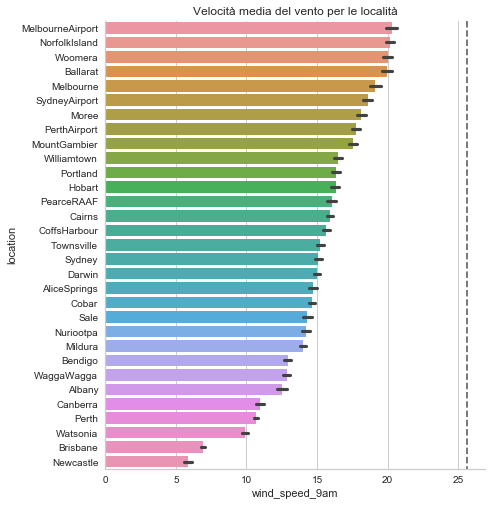

In [8]:
result = aus_descr.groupby(['location'])['wind_speed_9am'].aggregate(np.average).reset_index().sort_values('wind_speed_9am').iloc[::-1]
sns.catplot(x="wind_speed_9am", y="location", kind="bar", data=aus_descr, height=7, aspect=1, order=result['location'])
plt.title('Velocità media del vento per le località')
plt.axvline(25.63,1,0, color='dimgray', ls='--')
plt.show()

# Clustering
#### Preprocessing

In [9]:
# filtra per colonne:
aus_cluster = aus_descr.drop(["year","cloud_3pm","wind_dir_3pm","wind_speed_3pm","pressure_3pm","humidity_3pm","temp_3pm","rain_tomorrow"], axis=1)

# Prende 2 dataset:
aus1 = aus_cluster[aus_cluster["rainfall"]>0]       # solo i giorni di pioggia, rainfall, pressione
aus2 = aus_cluster[aus_cluster["state"]=="VIC"]     # solo i dati del Victoria, temperatura massima, velocità del vento, umidità

print(aus1.shape)
print(aus2.shape)

(33513, 13)
(24318, 13)


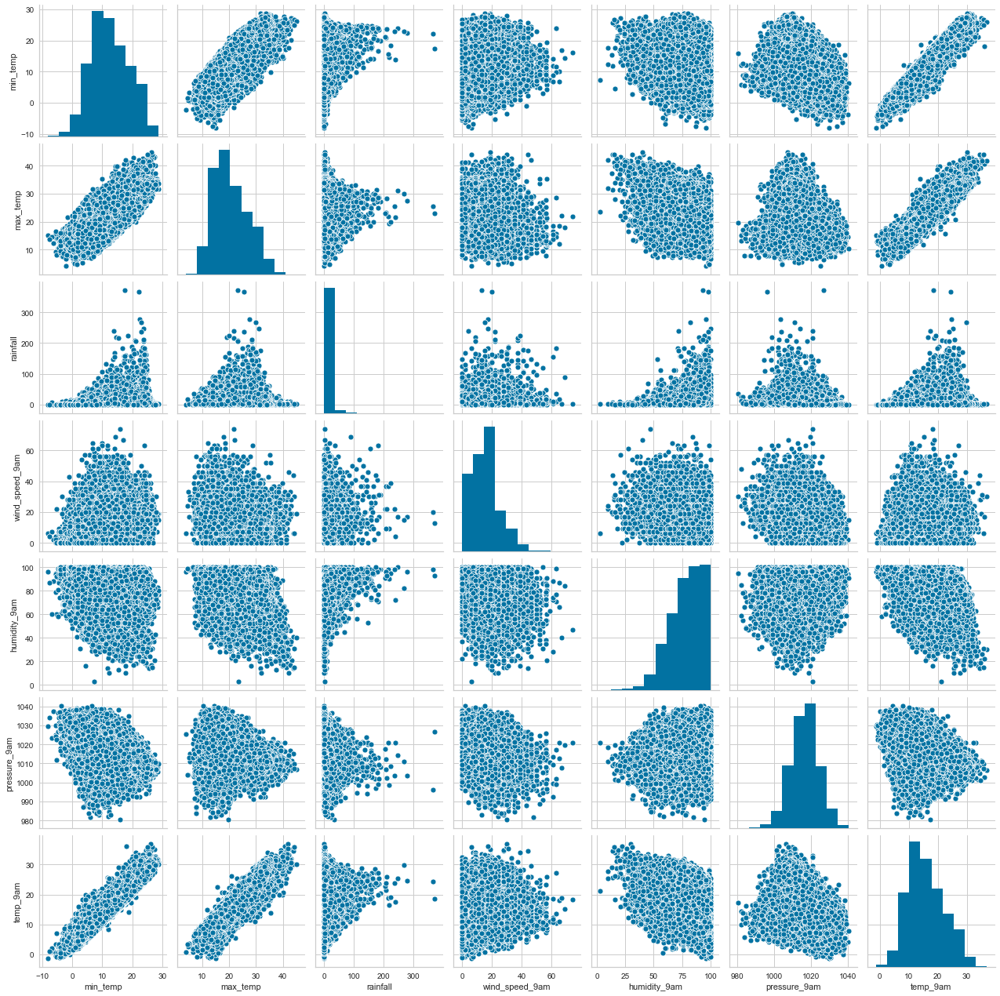

In [10]:
# Pairplot per visualizzare i possibili cluster con il primo dataset (solo giornate piovose)
sns.pairplot(aus1.drop(['cloud_9am','state','wind_dir_9am','rain_today'],axis=1));

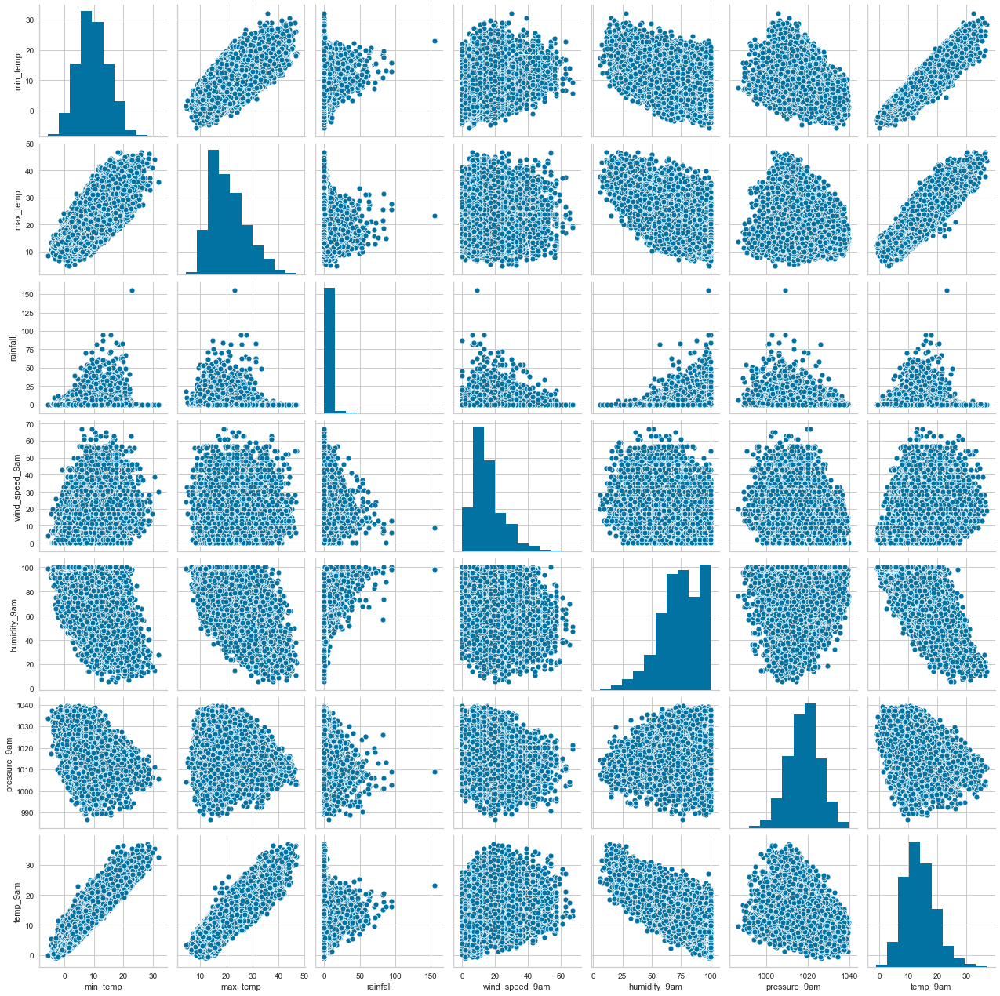

In [11]:
# Pairplot per visualizzare i possibili cluster con il secondo dataset (solo misure del victoria)
sns.pairplot(aus2.drop(['cloud_9am','state','wind_dir_9am','rain_today'],axis=1));

In [12]:
# 3 --> temperatura massima
# 4 --> rainfall
# 6 --> velocità del vento
# 7 --> umidità
# 8 --> pressione
# 9 --> nuvole

df_2d = aus1.iloc[:, [4,8]].values

df_3d1 = aus1.iloc[:, [4,6,8]].values
df_3d2 = aus2.iloc[:, [3,6,7]].values

df_pca1 = aus1.iloc[:, [4,6,8,9]].values
df_pca2 = aus2.iloc[:, [3,6,7,9]].values

df_dbscan = aus2.iloc[:, [3,6,7,9]].values

### KMeans 2D, dataset 1
##### Pioggia e pressione

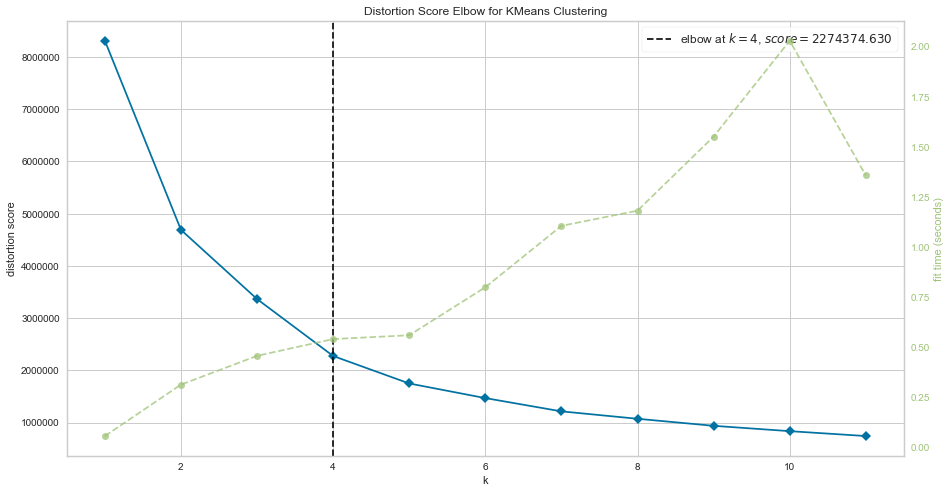

In [13]:
# Metodo Elbow di yellowbrick per valutare il numero di cluster
model = KMeans()
visualizer=KElbowVisualizer(model, k=(1,12))
plt.figure(figsize=(15,8))
visualizer.fit(df_2d)
visualizer.show();

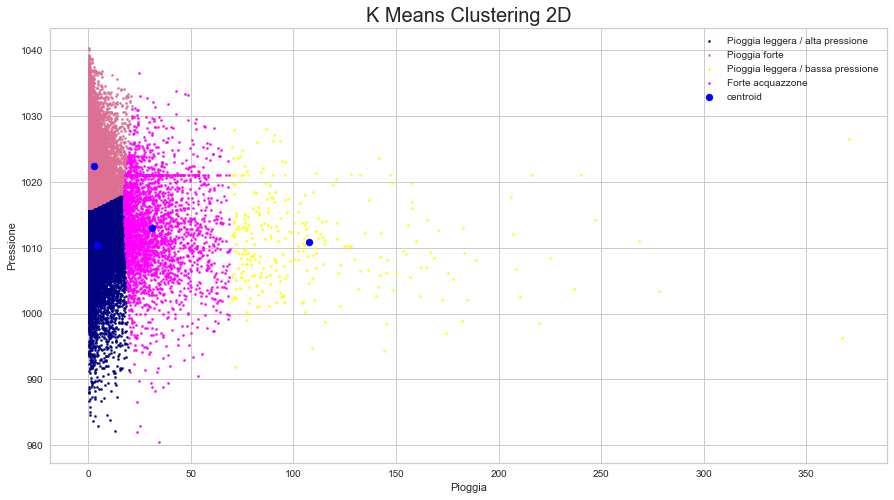

In [14]:
km = KMeans(n_clusters = 4, init = 'k-means++', max_iter = 300, n_init = 10, random_state = 0)
y_means = km.fit_predict(df_2d)

plt.figure(figsize=(15,8))
plt.scatter(df_2d[y_means == 0, 0], df_2d[y_means == 0, 1], s = 5, c = 'navy', label = 'Pioggia leggera / alta pressione')#poco acqua e poco vento
plt.scatter(df_2d[y_means == 1, 0], df_2d[y_means == 1, 1], s = 5, c = 'palevioletred', label = 'Pioggia forte')#tanta pioggia vento variabile
plt.scatter(df_2d[y_means == 2, 0], df_2d[y_means == 2, 1], s = 5, c = 'yellow', label = 'Pioggia leggera / bassa pressione') #poco vento e acqua
plt.scatter(df_2d[y_means == 3, 0], df_2d[y_means == 3, 1], s = 5, c = 'magenta', label = 'Forte acquazzone')#poca pioggia
plt.scatter(km.cluster_centers_[:,0], km.cluster_centers_[:, 1], s = 50, c = 'blue' , label = 'centroid')

plt.title('K Means Clustering 2D', fontsize = 20)
plt.xlabel('Pioggia')
plt.ylabel('Pressione')
plt.legend()
plt.show()

### KMeans 3D, dataset 1
##### pressione, rainfall e velocità del vento

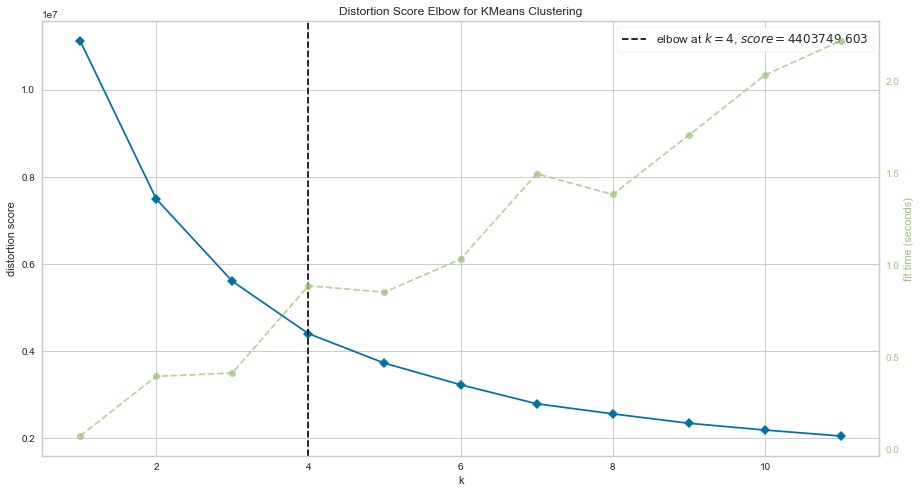

In [15]:
model = KMeans()
visualizer=KElbowVisualizer(model, k=(1,12))
plt.figure(figsize=(15,8))
visualizer.fit(df_3d1)
visualizer.show()

In [16]:
km = KMeans(n_clusters = 4, init = 'k-means++', max_iter = 300, n_init = 10, random_state = 0)
y_means = km.fit_predict(df_3d1)

fig = px.scatter_3d(aus1, x='pressure_9am', y='rainfall', z='wind_speed_9am', color=y_means);
fig.show()

### KMeans 3D, dataset 2
##### umidità, velocità del vento e temperatura massima

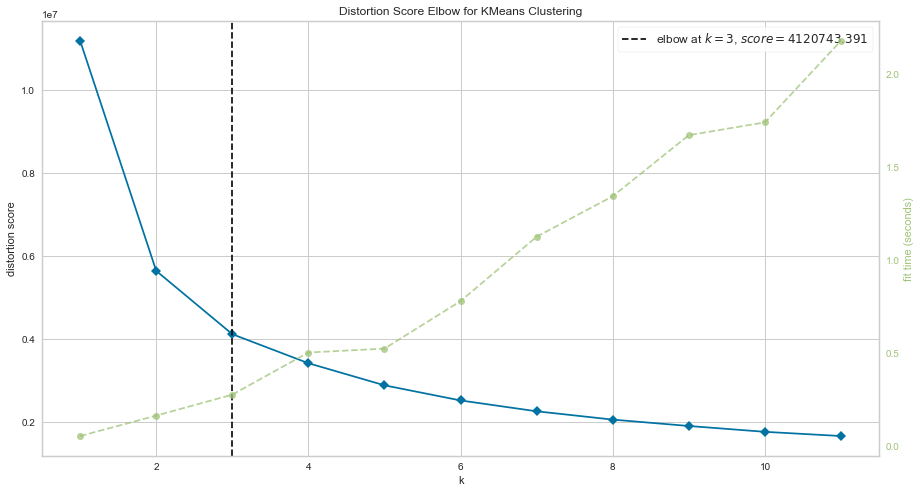

In [17]:
model = KMeans()
visualizer=KElbowVisualizer(model, k=(1,12))
plt.figure(figsize=(15,8))
visualizer.fit(df_3d2)
visualizer.show();

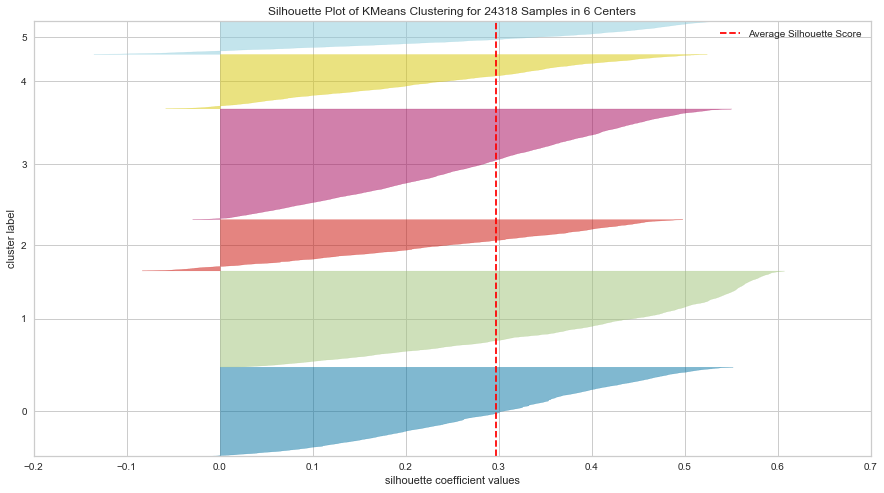

In [18]:
# Silhouette per vedere che prendere 6 cluster non è male
model = KMeans(6, random_state=42)
visualizer=SilhouetteVisualizer(model,colors="yellowbrick")
plt.figure(figsize=(15,8))
visualizer.fit(df_3d2)
visualizer.show();

In [19]:
km = KMeans(n_clusters = 6, init = 'k-means++', max_iter = 300, n_init = 10, random_state = 0)
y_means = km.fit_predict(df_3d2)

fig = px.scatter_3d(aus2, x='humidity_9am', y='wind_speed_9am', z='max_temp', color=y_means);
fig.show()

## Clustering gerarchico

### AgglomerativeClustering 2D
##### rainfall e pressione

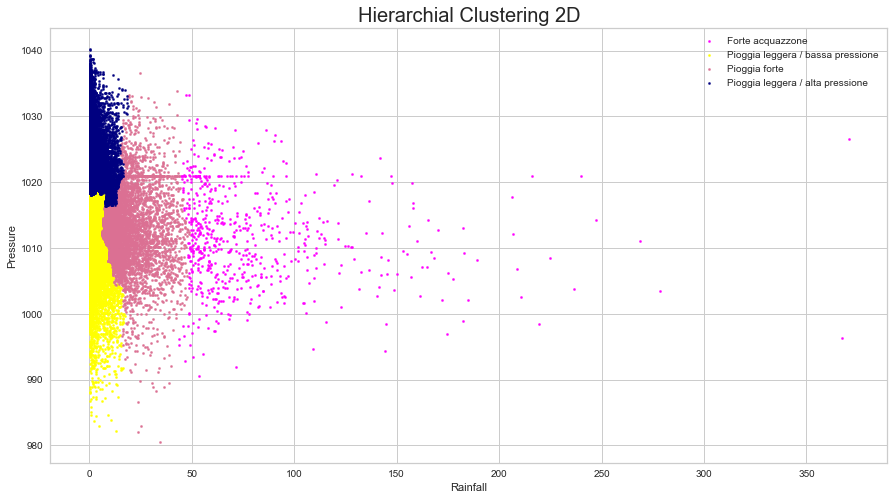

In [20]:
hc = AgglomerativeClustering(n_clusters = 4, affinity = "euclidean", linkage = "ward")
y_hc = hc.fit_predict(df_2d)

plt.figure(figsize=(15,8))
plt.scatter(df_2d[y_hc == 0, 0], df_2d[y_hc == 0, 1], s = 5, c = 'magenta', label = 'Forte acquazzone')
plt.scatter(df_2d[y_hc == 1, 0], df_2d[y_hc == 1, 1], s = 5, c = 'yellow', label = 'Pioggia leggera / bassa pressione')
plt.scatter(df_2d[y_hc == 2, 0], df_2d[y_hc == 2, 1], s = 5, c = 'palevioletred', label = 'Pioggia forte')
plt.scatter(df_2d[y_hc == 3, 0], df_2d[y_hc == 3, 1], s = 5, c = 'navy', label = 'Pioggia leggera / alta pressione')

plt.title('Hierarchial Clustering 2D', fontsize = 20)
plt.xlabel('Rainfall')
plt.ylabel('Pressure')
plt.legend()
plt.show();

#https://scikit-learn.org/stable/modules/generated/sklearn.cluster.AgglomerativeClustering.html#sklearn.cluster.AgglomerativeClustering

### AgglomerativeClustering 3D variabili, dataset 2
##### umidità, velocità del vento, temperatura massima

In [21]:
hc = AgglomerativeClustering(n_clusters = 6, affinity = "euclidean", linkage = "ward")
y_hc = hc.fit_predict(df_3d2)

fig = px.scatter_3d(aus2,x='humidity_9am', y='wind_speed_9am', z='max_temp', color=y_hc);
fig.show();

### PCA Cluster, dataset 1

##### rainfall, pressione + velocità del vento, nuvole

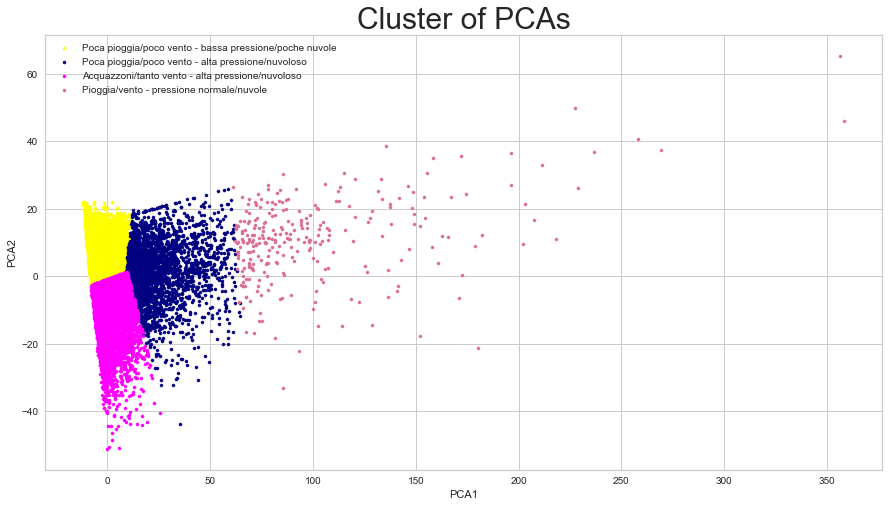

In [22]:
kmeans = KMeans(n_clusters = 4, init = 'k-means++', max_iter = 300, n_init = 10, random_state = 0)
ymeans = kmeans.fit_predict(df_pca1)

pca_x = PCA(n_components=2, svd_solver="auto").fit_transform(df_pca1)

plt.figure(figsize=(15,8))
plt.title('Cluster of PCAs', fontsize = 30)

plt.scatter(pca_x[ymeans == 0, 0], pca_x[ymeans == 0, 1], s = 10, c = 'yellow', label = 'Poca pioggia/poco vento - bassa pressione/poche nuvole')
plt.scatter(pca_x[ymeans == 1, 0], pca_x[ymeans == 1, 1], s = 10, c = 'navy', label = 'Poca pioggia/poco vento - alta pressione/nuvoloso')
plt.scatter(pca_x[ymeans == 2, 0], pca_x[ymeans == 2, 1], s = 10, c = 'magenta', label = 'Acquazzoni/tanto vento - alta pressione/nuvoloso')
plt.scatter(pca_x[ymeans == 3, 0], pca_x[ymeans == 3, 1], s = 10, c = 'palevioletred', label = 'Pioggia/vento - pressione normale/nuvole')

plt.xlabel('PCA1')
plt.ylabel('PCA2')
plt.legend()
plt.show()

### PCA Cluster, dataset 2

##### temperatura massima, velocità del vento, umidità + nuvole

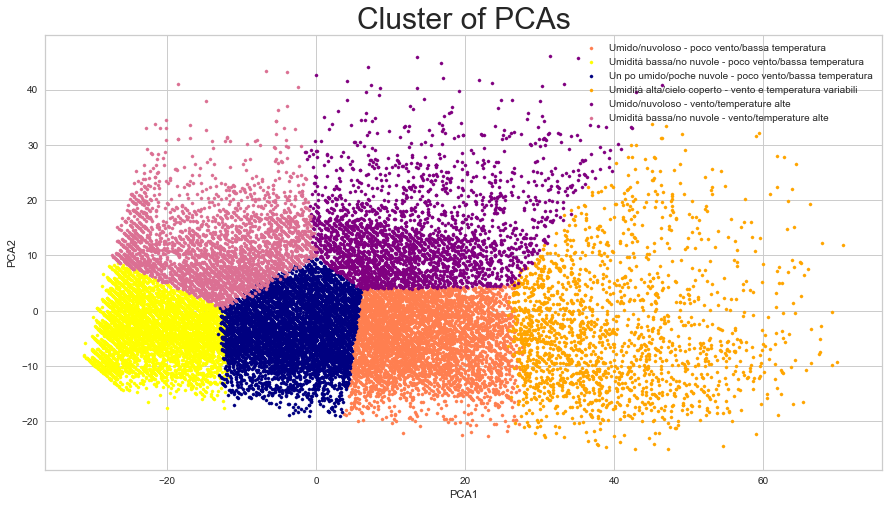

In [23]:
kmeans = KMeans(n_clusters = 6, init = 'k-means++', max_iter = 300, n_init = 10, random_state = 0)
ymeans = kmeans.fit_predict(df_pca2)

pca_x = PCA(n_components=2, svd_solver="auto").fit_transform(df_pca2)

plt.figure(figsize=(15,8))
plt.title('Cluster of PCAs', fontsize = 30)

plt.scatter(pca_x[ymeans == 0, 0], pca_x[ymeans == 0, 1], s = 10, c = 'coral', label = 'Umido/nuvoloso - poco vento/bassa temperatura')
plt.scatter(pca_x[ymeans == 1, 0], pca_x[ymeans == 1, 1], s = 10, c = 'yellow', label = 'Umidità bassa/no nuvole - poco vento/bassa temperatura')
plt.scatter(pca_x[ymeans == 2, 0], pca_x[ymeans == 2, 1], s = 10, c = 'navy', label = 'Un po umido/poche nuvole - poco vento/bassa temperatura')
plt.scatter(pca_x[ymeans == 3, 0], pca_x[ymeans == 3, 1], s = 10, c = 'orange', label = 'Umidità alta/cielo coperto - vento e temperatura variabili')
plt.scatter(pca_x[ymeans == 4, 0], pca_x[ymeans == 4, 1], s = 10, c = 'purple', label = 'Umido/nuvoloso - vento/temperature alte')
plt.scatter(pca_x[ymeans == 5, 0], pca_x[ymeans == 5, 1], s = 10, c = 'palevioletred', label = 'Umidità bassa/no nuvole - vento/temperature alte')

plt.xlabel('PCA1')
plt.ylabel('PCA2')
plt.legend()
plt.show()

## DB Scan, dataset 2

##### temperatura massima, velocità del vento, umidità + nuvole

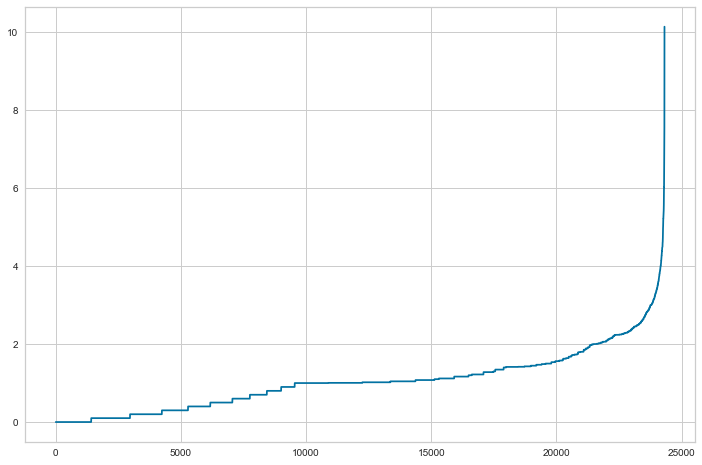

In [24]:
neigh = NearestNeighbors(n_neighbors=2)
nbrs = neigh.fit(df_dbscan)
distances, indices = nbrs.kneighbors(df_dbscan)

distances = np.sort(distances, axis=0)
plt.figure(figsize=(12,8))
plt.plot(distances[:,1]);

In [25]:
from sklearn.cluster import DBSCAN

db = DBSCAN(eps=2.4, min_samples=10).fit(df_pca2)
ymeans = db.labels_
max(ymeans)

25

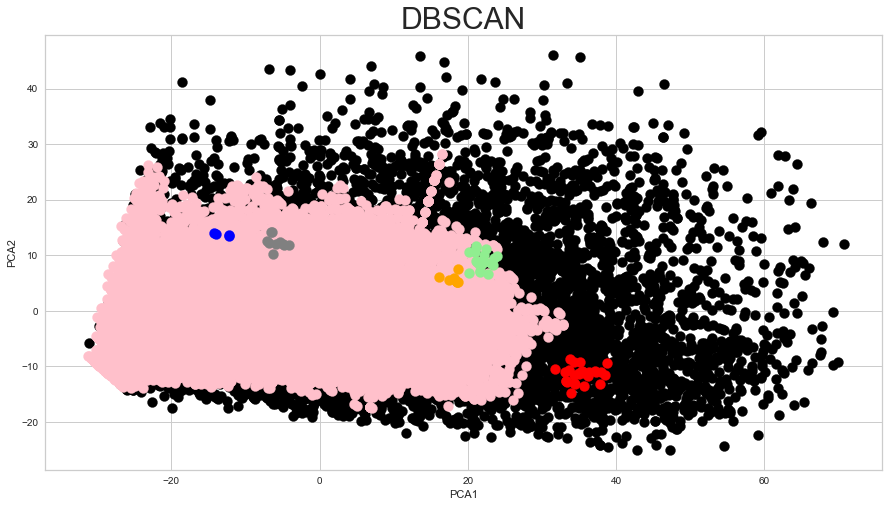

In [26]:
plt.figure(figsize=(15,8))
plt.title('DBSCAN', fontsize = 30)

plt.scatter(pca_x[ymeans == -1, 0], pca_x[ymeans == -1, 1], s = 100, c = 'black')
plt.scatter(pca_x[ymeans == 0, 0], pca_x[ymeans == 0, 1], s = 100, c = 'pink')
plt.scatter(pca_x[ymeans == 1, 0], pca_x[ymeans == 1, 1], s = 100, c = 'orange')
plt.scatter(pca_x[ymeans == 2, 0], pca_x[ymeans == 2, 1], s = 100, c = 'lightgreen')
plt.scatter(pca_x[ymeans == 3, 0], pca_x[ymeans == 3, 1], s = 100, c = 'blue')
plt.scatter(pca_x[ymeans == 4, 0], pca_x[ymeans == 4, 1], s = 100, c = 'gray')
plt.scatter(pca_x[ymeans == 5, 0], pca_x[ymeans == 5, 1], s = 100, c = 'red')

plt.xlabel('PCA1')
plt.ylabel('PCA2')
plt.show()

# Classificazione

### Preprocessing

In [27]:
australia = australia.reset_index()
australia = australia.drop(["index"], axis = 1)

# split della data, utilizziamo solo il mese nel modello per la classificazione
aus_class = australia

aus_class['date'] = pd.to_datetime(aus_class['date'])
aus_class['month'] = aus_class['date'].dt.month
aus_class = aus_class.drop(["date"],axis = 1)

# map dei campi categorici in numerici e scala in modo che abbiano lo stesso peso
le = preprocessing.LabelEncoder()
aus_class['location'] = le.fit_transform(aus_class['location'])
aus_class['wind_dir_3pm'] = le.fit_transform(aus_class['wind_dir_3pm'])
aus_class['rain_today'] = le.fit_transform(aus_class['rain_today'])
aus_class['rain_tomorrow'] = le.fit_transform(aus_class['rain_tomorrow'])
aus_class['state'] = le.fit_transform(aus_class['state'])

scaler = MinMaxScaler()
aus_class[['rainfall','wind_speed_3pm','humidity_3pm', 'pressure_3pm','cloud_3pm','temp_3pm']] = scaler.fit_transform(aus_class[['rainfall','wind_speed_3pm','humidity_3pm', 'pressure_3pm','cloud_3pm','temp_3pm']])

# elimina le colonne che hanno delle correlazioni
aus_class = aus_class.drop(["min_temp", "max_temp", "wind_dir_9am", "wind_speed_9am", "humidity_9am", "pressure_9am", "cloud_9am", "temp_9am" ], axis=1)

# riordina le colonne 
aus_class = aus_class[["month","location","rainfall","wind_dir_3pm","wind_speed_3pm","humidity_3pm","pressure_3pm","cloud_3pm","temp_3pm","rain_today","state","rain_tomorrow"]]

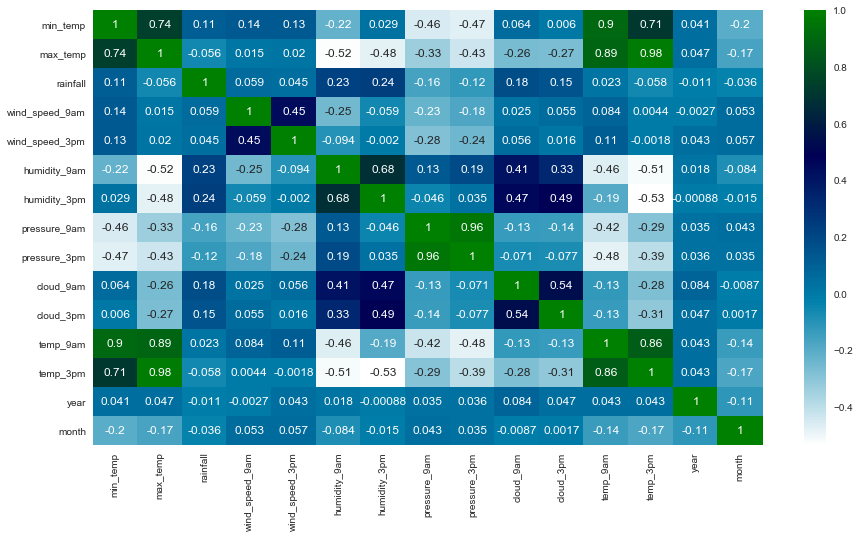

In [28]:
plt.figure(figsize=(15,8))
sns.heatmap(australia.corr(), cmap = 'ocean_r',annot = True);

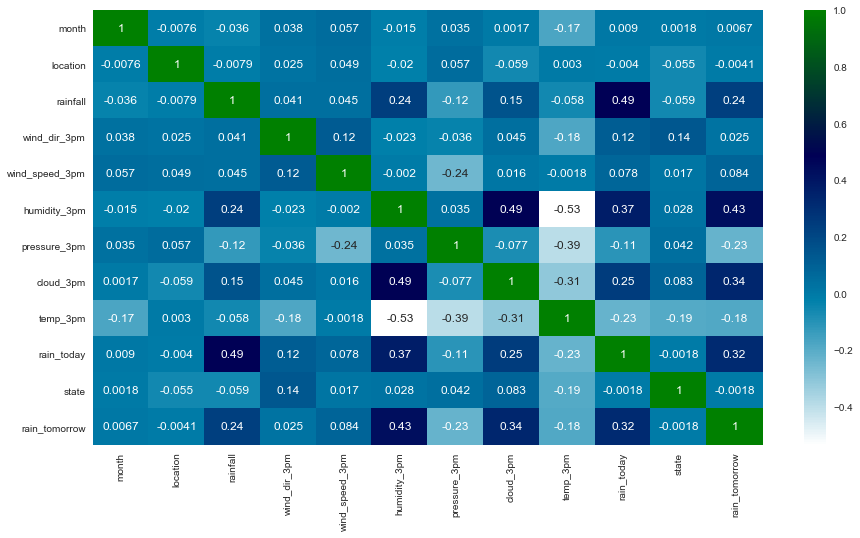

In [29]:
plt.figure(figsize=(15,8))
sns.heatmap(aus_class.corr(), cmap = 'ocean_r',annot = True);

In [30]:
# Variabile target --> "rain tomorrow"

# bilanciamento tra la classe 'si' e 'no'
si = aus_class[aus_class.rain_tomorrow == 1]
no = aus_class[aus_class.rain_tomorrow == 0]

print("Bilanciamento iniziale:              " + str(len(si)) + ', ' + str(len(no)))

balanced = pd.concat([no.sample(len(si)), si])

# x = dataset senza variabile target
# y = valori della variabile target
x = balanced.iloc[:,:-1] 
y = balanced.iloc[:,-1:] 

print("Tuple totali per la classificazione: " + str(len(balanced)))

# random state settato con il valore utilizzato di default solitamente
rs=42

# split con hold-out 
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.3, random_state = rs)

print('\nTraining e test set:')
print(x_train.shape)
print(x_test.shape)
print(y_train.shape)
print(y_test.shape)

Bilanciamento iniziale:              21101, 74107
Tuple totali per la classificazione: 42202

Training e test set:
(29541, 11)
(12661, 11)
(29541, 1)
(12661, 1)


### Modelli di classificazione

In [31]:
# algoritmi di classificazione scelti
classifiers = [
    DecisionTreeClassifier(random_state=rs),
    LinearSVC(random_state=rs),
    KNeighborsClassifier(n_neighbors = 3),
    RandomForestClassifier(n_estimators = 10, random_state=rs)
]

# Lista dei risultati:
clf_name = [] 
model_results = pd.DataFrame.copy(y_test) 

# Cross validation KFold
kfold = StratifiedKFold(n_splits=10)

cv_results = []      # risultati del cross validation
cv_acc = []          # accuratezza media dal cross validation, da massimizzata
cv_std = []          # Deviazione standard dell'accuratezza dal cross validation, da minimizzare

cnfm = []            # matrice di confusione
clr = []
roc_auc = [] 
roc_tpr = []
roc_fpr = []

for clf in classifiers:
    name = clf.__class__.__name__
    clf_name.append(name)
    
    # addestramento del modello e predizione nel test
    model = clf.fit(x_train, y_train)
    y_pred = model.predict(x_test)
    model_results[name] = y_pred
    
    # accuratezza
    cv_results.append(cross_val_score(clf, x_train, y_train, scoring = "accuracy", cv=kfold))
    acc = round(accuracy_score(y_test, y_pred), 2)
    
    # Accuratezza del modello con l'hold out
    print(f'Accuracy: {acc} \t ---> {name} ')
    
    # risultati utili per la matrice di confusione,
    # report di classificazione e curva roc
    cnfm.append(confusion_matrix(y_test, y_pred))
    clr.append(classification_report(y_test, y_pred))    

for i in cv_results:
    cv_acc.append(i.mean())
    cv_std.append(i.std())

Accuracy: 0.72 	 ---> DecisionTreeClassifier 
Accuracy: 0.76 	 ---> LinearSVC 
Accuracy: 0.7 	 ---> KNeighborsClassifier 
Accuracy: 0.76 	 ---> RandomForestClassifier 


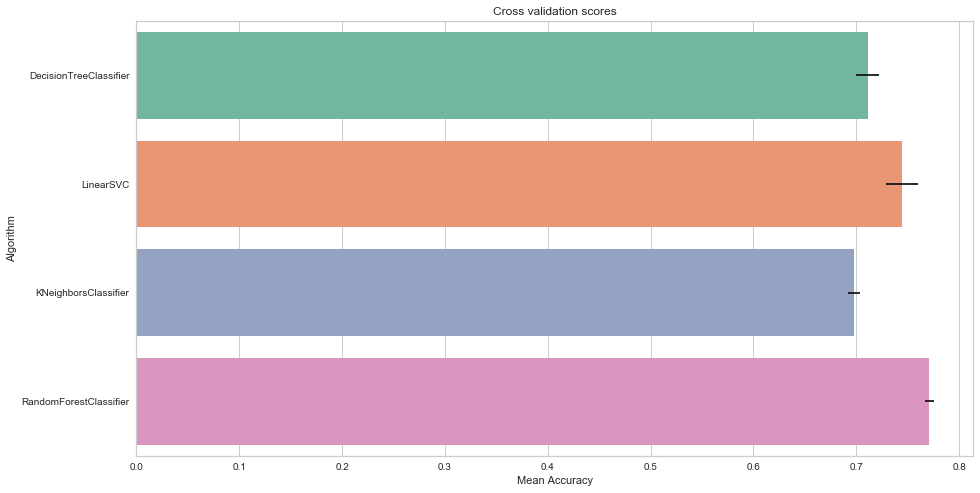

In [32]:
# Risultati dell'accuratezza del cross validation:
cv_res = pd.DataFrame({"CrossValMeans":cv_acc, "CrossValerrors": cv_std,"Algorithm":clf_name})

plt.figure(figsize=(15,8))
sns.barplot("CrossValMeans","Algorithm",data = cv_res, palette="Set2",orient = "h",**{'xerr':cv_std})
plt.xlabel("Mean Accuracy")
plt.title("Cross validation scores");

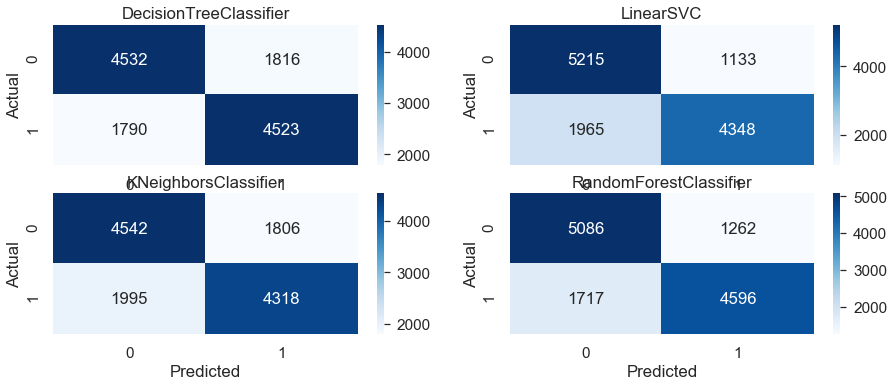

In [33]:
# Matrice di confusione

plt.figure(figsize=(15,15))
sns.set(font_scale=1.4)
for i in range(len(classifiers)):
    plt.subplot(5,2,i+1) 
    sns.heatmap(cnfm[i], annot=True, fmt="d",cmap="Blues")
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.title(clf_name[i])

In [34]:
# Classification reports
for i in range(len(classifiers)):
    print (f"{clf_name[i]} Classification Report:" );
    print (clr[i]);

DecisionTreeClassifier Classification Report:
              precision    recall  f1-score   support

           0       0.72      0.71      0.72      6348
           1       0.71      0.72      0.71      6313

    accuracy                           0.72     12661
   macro avg       0.72      0.72      0.72     12661
weighted avg       0.72      0.72      0.72     12661

LinearSVC Classification Report:
              precision    recall  f1-score   support

           0       0.73      0.82      0.77      6348
           1       0.79      0.69      0.74      6313

    accuracy                           0.76     12661
   macro avg       0.76      0.76      0.75     12661
weighted avg       0.76      0.76      0.75     12661

KNeighborsClassifier Classification Report:
              precision    recall  f1-score   support

           0       0.69      0.72      0.71      6348
           1       0.71      0.68      0.69      6313

    accuracy                           0.70     12661
   ma

## YELLOWBRICK
#### Visualizzazione dei parametri di valutazione 

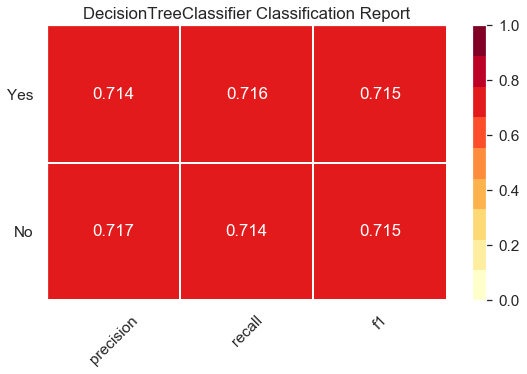

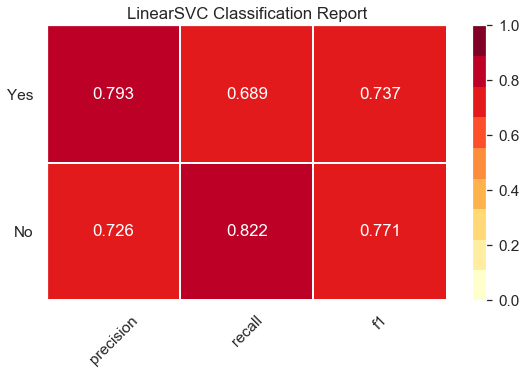

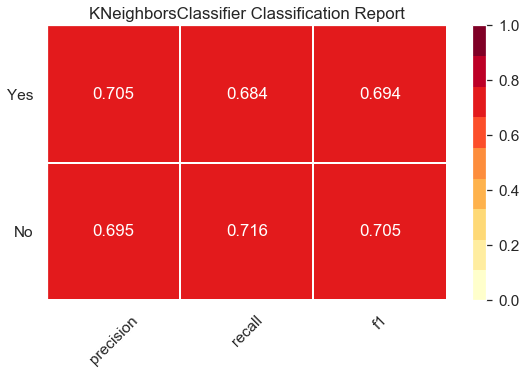

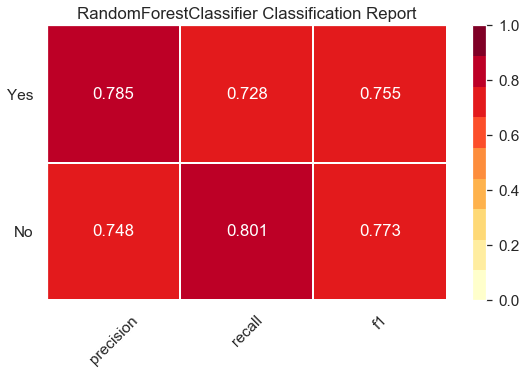

In [35]:
# precision, recall e f1-score per ogni classificatore per ogni classe
for clf in classifiers:
    visualizer = ClassificationReport(clf, classes = ['No', 'Yes'])
    visualizer.fit(x_train, y_train)
    visualizer.score(x_test, y_test)
    G = visualizer.poof()                      

### Grid Search

In [36]:
# cerca i parametri migliori per decision tree e random forest  
DT_param = {"max_depth": [2,3,8,10],
            "max_features": [0.3, 0.7, 1],
            "min_samples_split": [2, 3, 10],
            "min_samples_leaf": [1, 3, 10],
            "criterion": ["gini"]}

RF_param = {"max_depth": [None],
            "max_features": [0.3, 0.7, 1],
            "min_samples_split": [2, 3, 10],
            "min_samples_leaf": [1, 3, 10],
            "bootstrap": [False],
            "n_estimators" :[100,300],
            "criterion": ["gini"]}

DTgs = GridSearchCV(DecisionTreeClassifier(), param_grid=DT_param, cv=kfold, n_jobs=4, scoring="accuracy", verbose = 1)
RFgs = GridSearchCV(RandomForestClassifier(), param_grid=RF_param, cv=kfold, n_jobs=4, scoring="accuracy", verbose = 1)

models = [DTgs, RFgs]

gs_model = []
score = []

for model in models:
    model.fit(x_train, y_train)
    gs_model.append(model.best_estimator_)
    score.append(model.best_score_)

Fitting 10 folds for each of 108 candidates, totalling 1080 fits


[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  68 tasks      | elapsed:    1.7s
[Parallel(n_jobs=4)]: Done 1080 out of 1080 | elapsed:   10.1s finished
[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.


Fitting 10 folds for each of 54 candidates, totalling 540 fits


[Parallel(n_jobs=4)]: Done  42 tasks      | elapsed:  1.9min
[Parallel(n_jobs=4)]: Done 192 tasks      | elapsed:  8.3min
[Parallel(n_jobs=4)]: Done 442 tasks      | elapsed: 25.5min
[Parallel(n_jobs=4)]: Done 540 out of 540 | elapsed: 27.7min finished


In [46]:
# lancio nuovamente i modelli con i nuovi parametri estratti dalla grid search

for clf in gs_model:
    name = clf.__class__.__name__
    clf_name.append(name)

    model = clf.fit(x_train, y_train)
    y_pred = model.predict(x_test)
    model_results[name] = y_pred

    cv_results.append(cross_val_score(clf, x_train, y_train, scoring = "accuracy", cv = kfold))
    acc = round(accuracy_score(y_test, y_pred), 2)
    print(f'Accuracy: {acc} \t ---> {name} ')
    
    cnfm.append(confusion_matrix(y_test, y_pred))
    clr.append(classification_report(y_test, y_pred))
    fpr, tpr, thresholds = roc_curve(y_pred, y_test)
    roc_auc.append(auc(fpr, tpr))
    roc_tpr.append(tpr)
    roc_fpr.append(fpr)
    
for i in cv_results:
    cv_acc.append(i.mean())
    cv_std.append(i.std())

print('')
print("score without GridSearchCV: ", cv_acc[0], cv_acc[1])
print("score with GridSearchCV: ", score)

Accuracy: 0.76 	 ---> DecisionTreeClassifier 
Accuracy: 0.79 	 ---> RandomForestClassifier 

score without GridSearchCV:  0.7112493656254332 0.7443895856030482
score with GridSearchCV:  [0.7647001112375087, 0.7926271756326847]


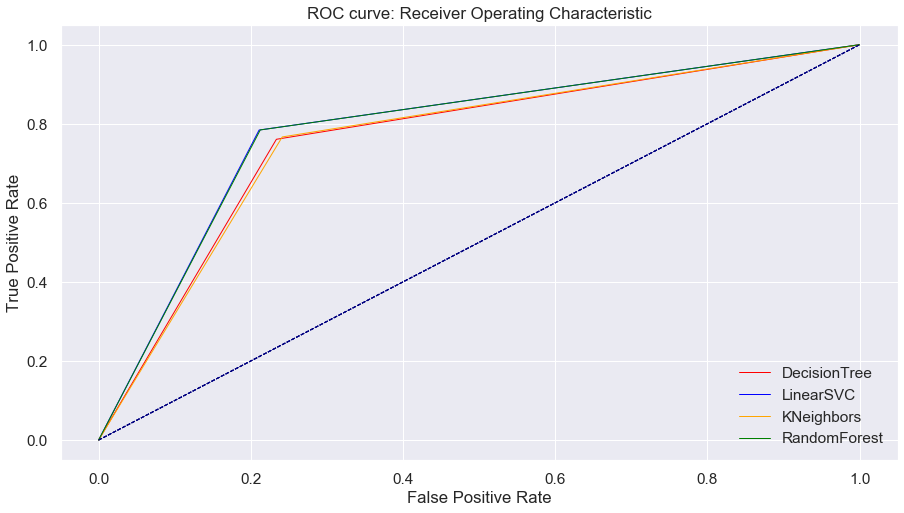

In [40]:
# Curva ROC
plt.figure(figsize=(15,8))
for i in range(len(classifiers)):
    cm = ['red', 'blue', 'orange', 'green', 'pink', 'yellow', 'lightgreen', 'black', 'purple', 'lightblue'] #add more colours for more algorithms
    plt.plot(roc_fpr[i], roc_tpr[i], c=cm[i], lw=1, label=clf_name[i].replace("Classifier", ""))
    plt.plot([0, 1], [0, 1], color='navy', lw=1, linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC curve: Receiver Operating Characteristic')
    plt.legend(loc="lower right")